In [9]:
import librosa
import librosa.display
import scipy as sp
import IPython.display as ipd
import matplotlib.pyplot as plt

from scipy.signal import stft
import numpy as np
import soundfile as sf
from scipy import fft

# create white noise and add to piano_c.wav

In [10]:
audio_path = "input/Nums_5dot1_24_48000.wav"
signal, sr = librosa.load(audio_path)
ipd.Audio(audio_path)

In [11]:
def fftnoise(f):
    f = np.array(f, dtype='complex')
    Np = (len(f) - 1) // 2
    phases = np.random.rand(Np) * 2 * np.pi
    phases = np.cos(phases) + 1j * np.sin(phases)
    f[1:Np+1] *= phases
    f[-1:-1-Np:-1] = np.conj(f[1:Np+1])
    return np.fft.ifft(f).real

sampling_rate = 22050
mean = 0
std = 1 
num_samples =  signal.shape
samples = np.random.normal(mean, std, size=num_samples)

test = fftnoise(samples)
sf.write('whitenoise.wav', test, sampling_rate)
audio_data = np.sum([test, signal],axis=0 )
sf.write('note_with_whitenoise.wav', audio_data, sampling_rate)
ipd.Audio('whitenoise.wav')

In [12]:
ipd.Audio('note_with_whitenoise.wav')

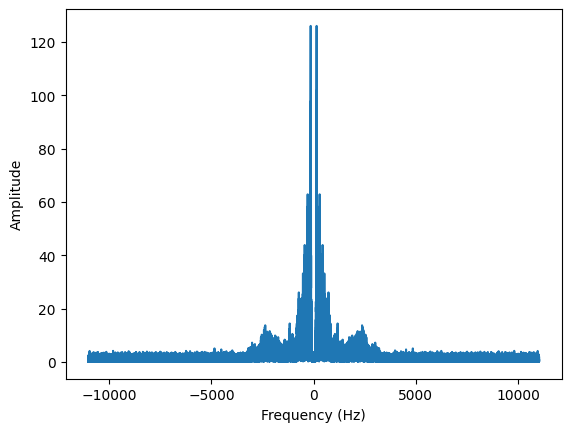

In [13]:
# # Load audio file
audio_data,sample_rate = librosa.load('note_with_whitenoise.wav')
# Apply Fourier transform to the audio signal
audio_spectrum = fft.fft(audio_data)

# Plot the frequency spectrum
freqs = fft.fftfreq(len(audio_spectrum)) * sample_rate
plt.plot(freqs, abs(audio_spectrum))
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.show()

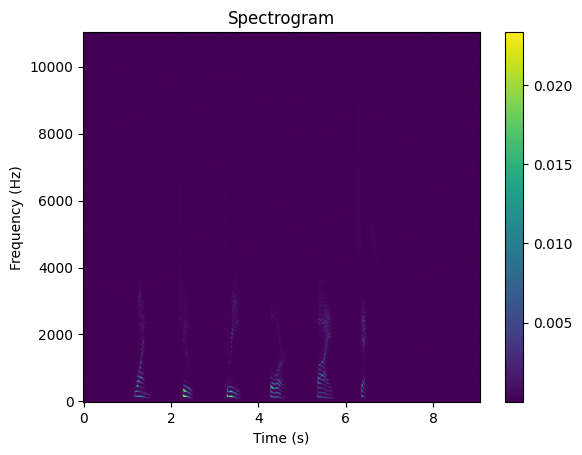

In [25]:
# Define the window size and overlap
window_size = 1024
overlap = window_size // 2
# Compute the STFT using scipy.signal.stft
freqs, times, spec = stft(audio_data, fs=sample_rate, nperseg=window_size, noverlap=overlap)
# Plot the spectrogram
plt.pcolormesh(times, freqs, np.abs(spec), cmap='viridis')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Spectrogram')
plt.colorbar()
plt.show()



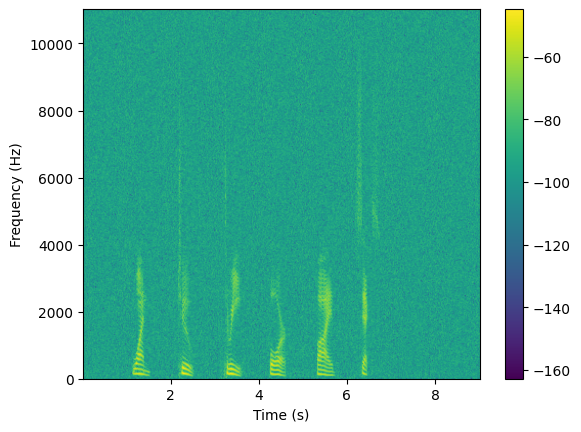

In [24]:
# Load audio file

# Calculate the spectrogram of the audio signal
nperseg = 1024
noverlap = int(nperseg / 2)
spec,frequencies, times, spectrogram = plt.specgram(audio_data, NFFT=nperseg, noverlap=noverlap, Fs=sample_rate, cmap='viridis')

# Plot the spectrogram
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.colorbar()
plt.show()


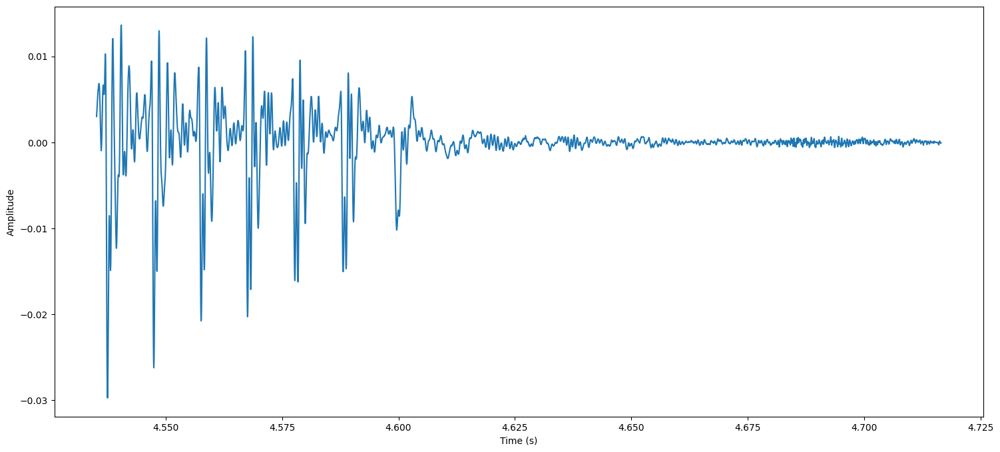

In [22]:
audio_data,sample_rate = librosa.load('note_with_whitenoise.wav')
samples = range(len(audio_data))
t = librosa.samples_to_time(samples, sr=sr)

plt.figure(figsize=(18, 8))
plt.plot(t[100000:104000], signal[100000:104000]) 
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

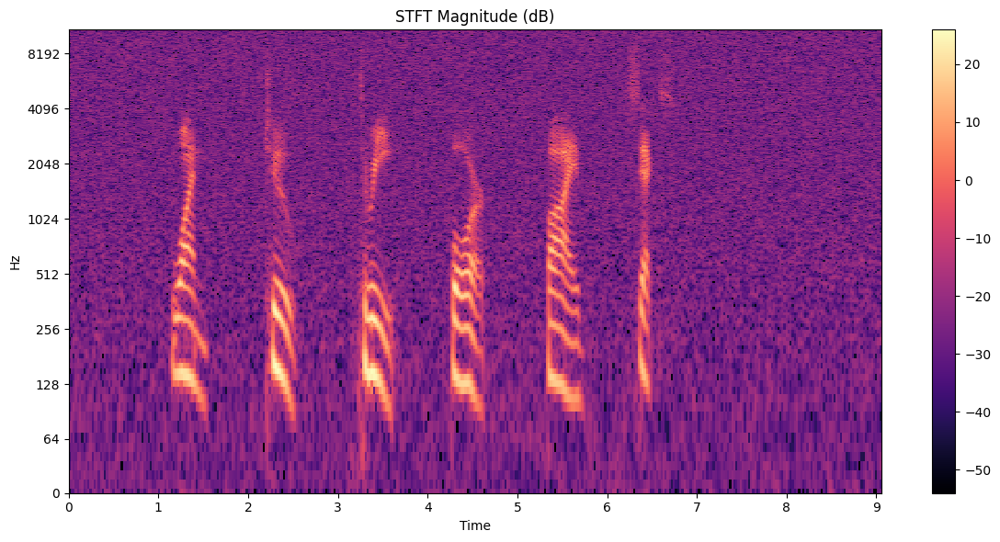

In [23]:
# Apply STFT
n_fft = 2048
hop_length = 512
stft_ = librosa.stft(audio_data, n_fft=n_fft, hop_length=hop_length)

# Get the magnitude and phase of the STFT
magnitude = librosa.magphase(stft_)[0]
phase = librosa.magphase(stft_)[1]

# Optional: Convert magnitude to decibels (dB)
magnitude_db = librosa.amplitude_to_db(magnitude)

# Optional: Visualize the STFT
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
librosa.display.specshow(magnitude_db, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('STFT Magnitude (dB)')
plt.tight_layout()
plt.show()

# White noise


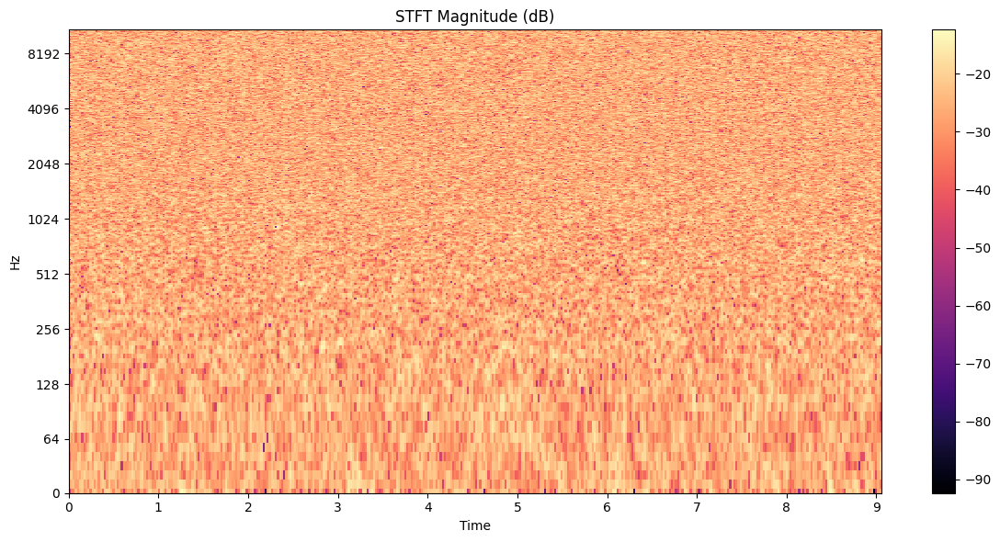

In [30]:

test_clean, sample_rate = librosa.load("whitenoise.wav")
# Apply STFT
n_fft = 2048
hop_length = 512
stft_ = librosa.stft(test_clean, n_fft=n_fft, hop_length=hop_length)

# Get the magnitude and phase of the STFT
magnitude_noise = librosa.magphase(stft_)[0]
phase_noise = librosa.magphase(stft_)[1]

# Optional: Convert magnitude to decibels (dB)
magnitude_db = librosa.amplitude_to_db(magnitude_noise)

# Optional: Visualize the STFT
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
librosa.display.specshow(magnitude_db, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('STFT Magnitude (dB)')
plt.tight_layout()
plt.show()

In [1]:
# calculate moving average of white noise
def moving_average(array, window_size):
    ret = np.cumsum(array, dtype=float)
    ret[window_size:] = ret[window_size:] - ret[:-window_size]
    return ret[window_size - 1:] / window_size

mag_noise_abs = np.abs(magnitude_noise)
noise_moving_average = moving_average(np.abs(mag_noise_abs), 10)
magnitude_noisy = np.abs(magnitude)


# subtract mag_noise_abs from magnitude_noisy
magnitude_less_noise = magnitude_noisy - mag_noise_abs

clean_sound = librosa.istft(magnitude_less_noise*5,hop_length,n_fft)
sf.write('test.wav', clean_sound, sample_rate)

NameError: name 'np' is not defined

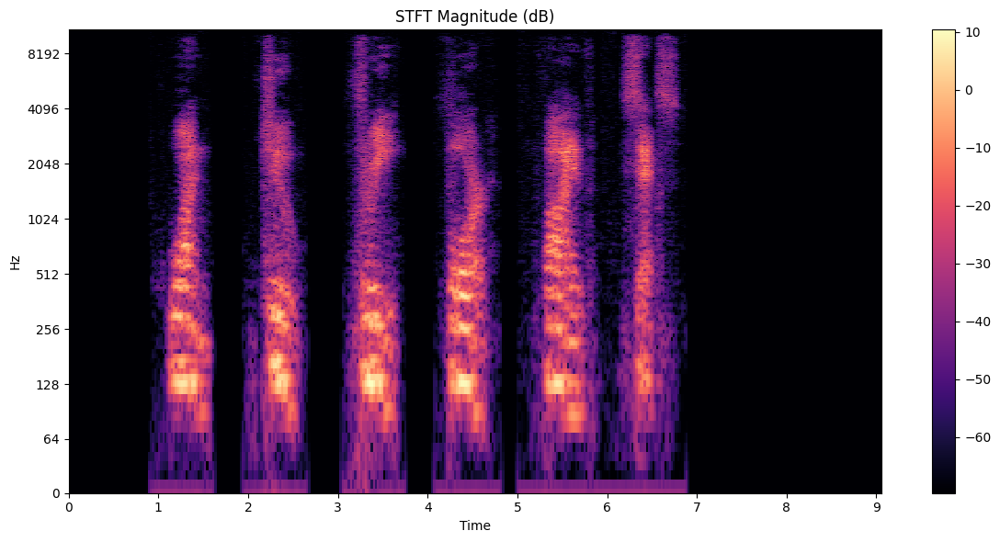

In [31]:
test_clean, sample_rate = librosa.load("test.wav")
# Apply STFT
n_fft = 2048
hop_length = 512
stft_ = librosa.stft(test_clean, n_fft=n_fft, hop_length=hop_length)

# Get the magnitude and phase of the STFT
magnitude_noise = librosa.magphase(stft_)[0]
phase_noise = librosa.magphase(stft_)[1]

# Optional: Convert magnitude to decibels (dB)
magnitude_db = librosa.amplitude_to_db(magnitude_noise)

# Optional: Visualize the STFT
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
librosa.display.specshow(magnitude_db, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('STFT Magnitude (dB)')
plt.tight_layout()
plt.show()